In [124]:
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print(mmdet.__version__)

# Check mmcv installation
import mmcv
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(mmcv.__version__)
print(get_compiling_cuda_version())
print(get_compiler_version())

# Check mmocr installation
import mmocr
print(mmocr.__version__)

1.10.2 True
3.0.0
2.0.0
11.3
MSVC 192829924
1.0.0


In [125]:
# Visualize the results
import matplotlib.pyplot as plt

In [126]:
model = torch.load("sdmgr_novisual_60e_wildreceipt-openset_20220831_200807-dedf15ec.pth")

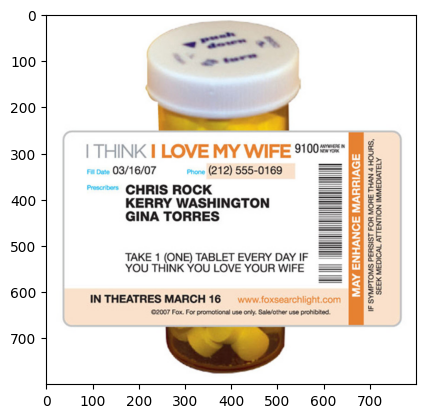

In [127]:
predicted_img = mmcv.imread('image_1.jpg')
plt.imshow(mmcv.bgr2rgb(predicted_img))
plt.show()


In [128]:
from mmocr.apis import MMOCRInferencer
kie = MMOCRInferencer(det='DBNet', rec='SAR', kie='SDMGR',device= 'cuda')
kie('demo/demo_kie.jpeg', show=True)

Loads checkpoint by http backend from path: https://download.openmmlab.com/mmocr/textdet/dbnet/dbnet_resnet50-oclip_1200e_icdar2015/dbnet_resnet50-oclip_1200e_icdar2015_20221102_115917-bde8c87a.pth
05/24 06:26:00 - mmengine - WARNING - Failed to search registry with scope "mmocr" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmocr" is a correct scope, or whether the registry is initialized.
05/24 06:26:00 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmocr/textrecog/sar/sar_resnet31_parallel-decoder_5e_st-sub_mj-sub_sa_real/sar_resnet31_parallel-decoder_5e_st-sub_mj-sub_sa_real_20220915_171910-04eb4e75.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preproc

Output()

Loads checkpoint by http backend from path: https://download.openmmlab.com/mmocr/kie/sdmgr/sdmgr_unet16_60e_wildreceipt/sdmgr_unet16_60e_wildreceipt_20220825_151648-22419f37.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preprocessor.mean, data_preprocessor.std



FileNotFoundError: [Errno 2] No such file or directory: 'demo/demo_kie.jpeg'

In [ ]:
import cv2
cv2.__version__

'4.6.0'

In [62]:
import stitching
def plot_image(img, figsize_in_inches=(5,5)):
    fig, ax = plt.subplots(figsize=figsize_in_inches)
    ax.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.show()
stitcher = stitching.Stitcher()
print(cv2.imread("testStitching_1.JPG").shape)
print(cv2.imread("testStitching_2.JPG").shape)
print(cv2.imread("testStitching_3.JPG").shape)
weir_imgs = ["image_unwrapped\D0.jpg","image_unwrapped\D1.jpg","image_unwrapped\D2.jpg"]


(302, 545, 3)
(307, 547, 3)
(395, 705, 3)


In [63]:
from matplotlib import pyplot as plt
import cv2 as cv
import numpy as np
from pathlib import Path

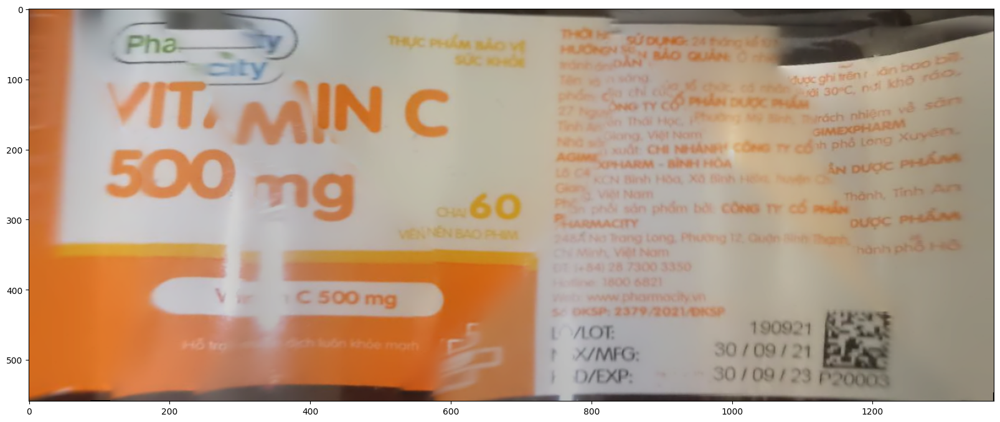

In [64]:
def plot_image(img, figsize_in_inches=(5,5)):
    fig, ax = plt.subplots(figsize=figsize_in_inches)
    ax.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.show()
    
def plot_images(imgs, figsize_in_inches=(5,5)):
    fig, axs = plt.subplots(1, len(imgs), figsize=figsize_in_inches)
    for col, img in enumerate(imgs):
        axs[col].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.show()
# load images
weir_imgs = ["image_unwrapped\D0.jpg","image_unwrapped\D1.jpg","image_unwrapped\D2.jpg","image_unwrapped\D3.jpg","image_unwrapped\D4.jpg","image_unwrapped\D5.jpg","image_unwrapped\D6.jpg","image_unwrapped\D7.jpg","image_unwrapped\D8.jpg"]
plot_image(panorama, (20,20))


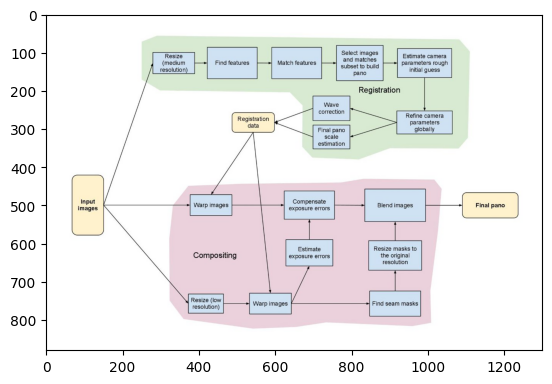

In [65]:
img_pipline = plt.imread("StitchingPipeline.jpg")
plt.imshow(img_pipline)

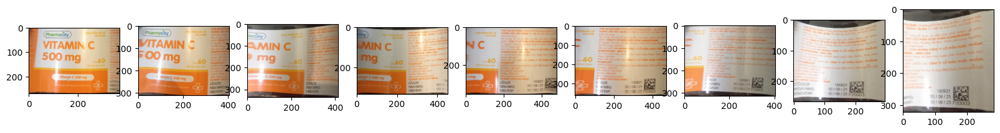

In [66]:
# FIND REGISTRATION OF DATA
#----------resize------------------
from stitching.image_handler import ImageHandler
img_handler = ImageHandler()
img_handler.set_img_names(weir_imgs)
medium_imgs = list(img_handler.resize_to_medium_resolution())
low_imgs = list(img_handler.resize_to_low_resolution(medium_imgs))
final_imgs = list(img_handler.resize_to_final_resolution())
original_size = img_handler.img_sizes[0]
medium_size = img_handler.get_image_size(medium_imgs[0])
low_size = img_handler.get_image_size(low_imgs[0])
final_size = img_handler.get_image_size(final_imgs[0])
plot_images(low_imgs, (20,20))


[[0.         1.95454545 0.58823529 0.625      0.4        0.34682081
  0.37313433 0.4        0.37313433]
 [1.95454545 0.         1.42857143 0.52356021 1.10047847 0.36363636
  0.34965035 0.4        0.44776119]
 [0.58823529 1.42857143 0.         0.8583691  1.48288973 0.64516129
  0.58823529 0.4        0.4379562 ]
 [0.625      0.52356021 0.8583691  0.         1.26696833 0.54794521
  0.44247788 0.38167939 0.45801527]
 [0.4        1.10047847 1.48288973 1.26696833 0.         1.44092219
  0.73863636 0.93220339 1.78181818]
 [0.34682081 0.36363636 0.64516129 0.54794521 1.44092219 0.
  1.69164882 1.71974522 2.08502024]
 [0.37313433 0.34965035 0.58823529 0.44247788 0.73863636 1.69164882
  0.         1.73501577 1.81578947]
 [0.4        0.4        0.4        0.38167939 0.93220339 1.71974522
  1.73501577 0.         2.26804124]
 [0.37313433 0.44776119 0.4379562  0.45801527 1.78181818 2.08502024
  1.81578947 2.26804124 0.        ]]
Matches Image 1 to Image 2


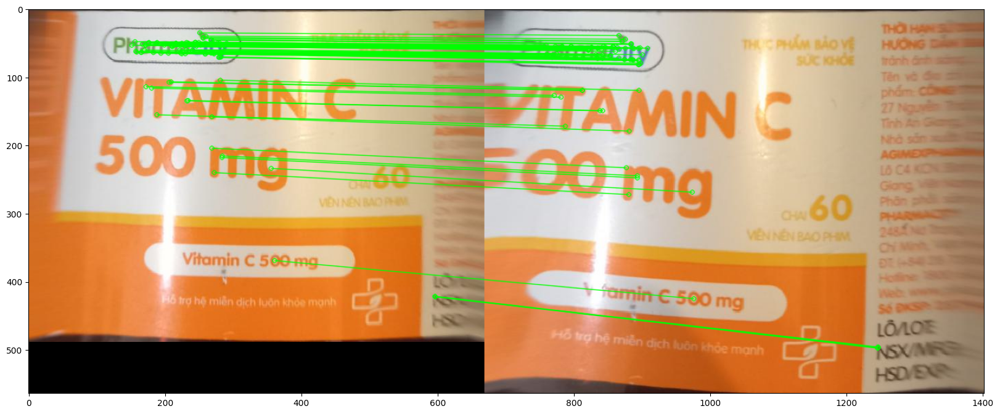

Matches Image 5 to Image 9


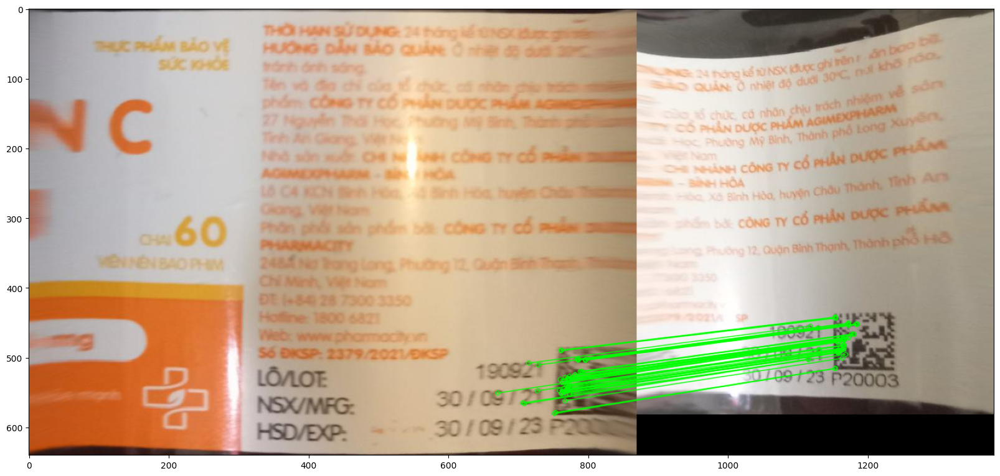

Matches Image 6 to Image 7


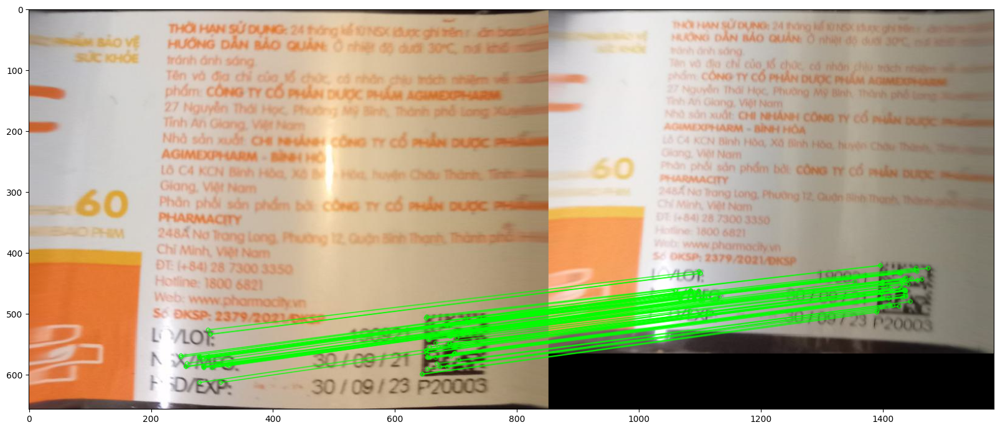

Matches Image 6 to Image 8


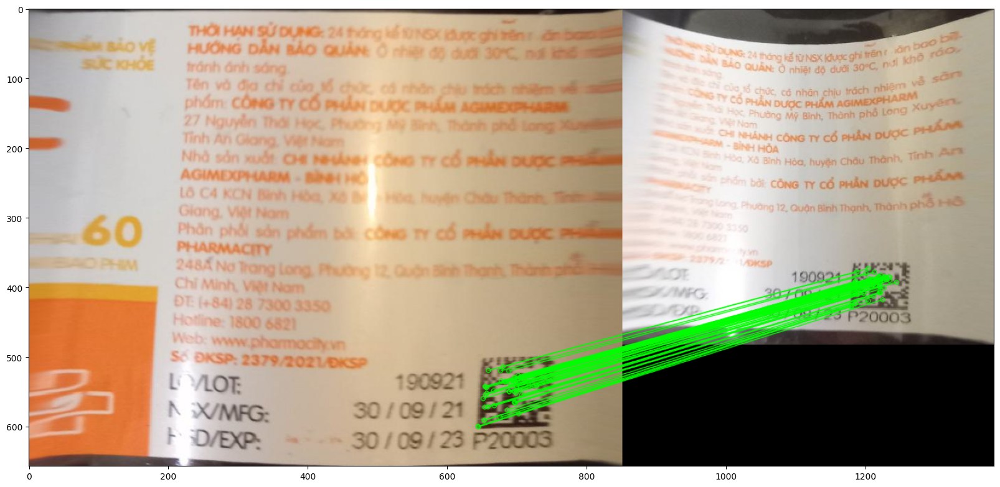

Matches Image 6 to Image 9


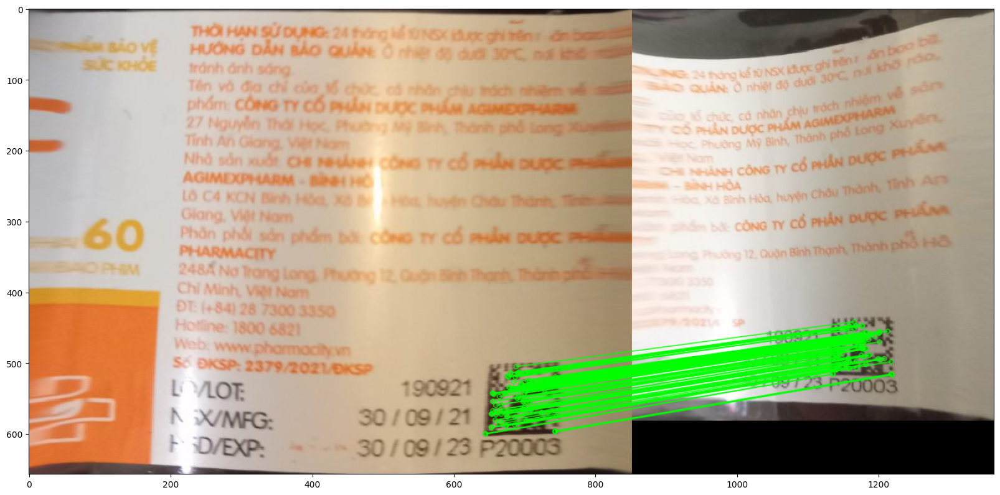

Matches Image 7 to Image 8


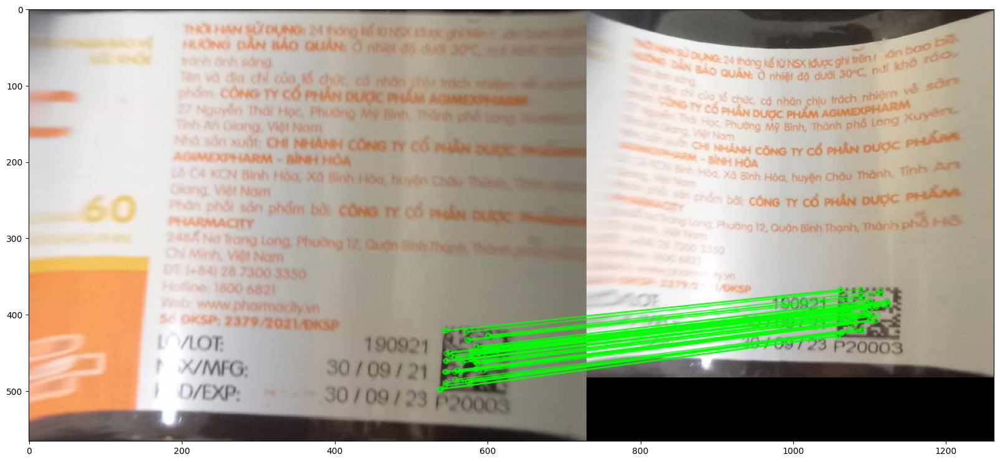

Matches Image 7 to Image 9


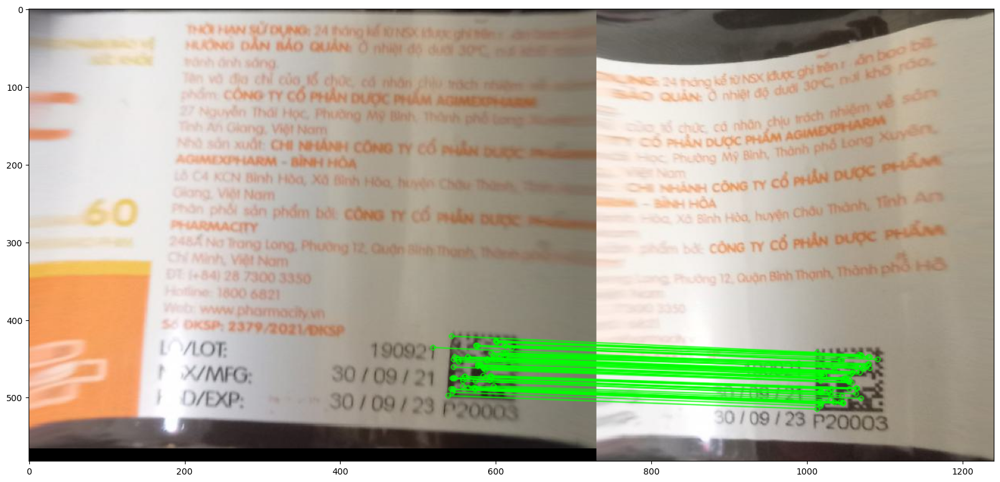

Matches Image 8 to Image 9


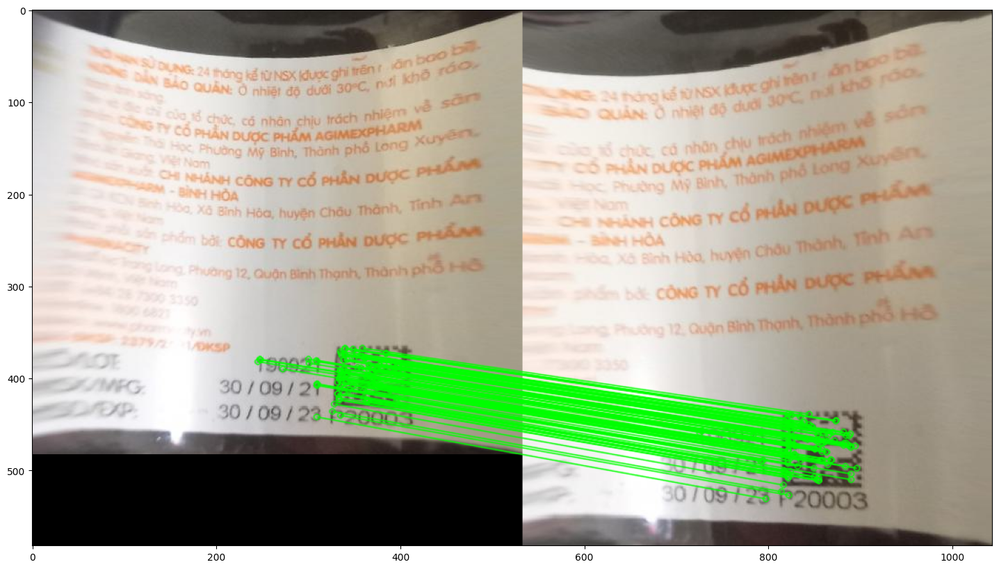

In [53]:
#----------find features-----------
from stitching.feature_detector import FeatureDetector
finder = FeatureDetector()
features = [finder.detect_features(img) for img in medium_imgs]
keypoints_center_img = finder.draw_keypoints(medium_imgs[1], features[1])
#----------Match features----------
from stitching.feature_matcher import FeatureMatcher

matcher = FeatureMatcher()
matches = matcher.match_features(features)
print(matcher.get_confidence_matrix(matches))

all_relevant_matches = matcher.draw_matches_matrix(medium_imgs, features, matches, conf_thresh=1.5, 
                                                   inliers=True, matchColor=(0, 255, 0))

for idx1, idx2, img in all_relevant_matches:
    print(f"Matches Image {idx1+1} to Image {idx2+1}")
    plot_image(img, (20,10))


In [54]:
#---------select subset------------
from stitching.subsetter import Subsetter

subsetter = Subsetter()
dot_notation = subsetter.get_matches_graph(img_handler.img_names, matches)
print(dot_notation)
indices = subsetter.get_indices_to_keep(features, matches)

medium_imgs = subsetter.subset_list(medium_imgs, indices)
low_imgs = subsetter.subset_list(low_imgs, indices)
final_imgs = subsetter.subset_list(final_imgs, indices)
features = subsetter.subset_list(features, indices)
matches = subsetter.subset_matches(matches, indices)

img_names = subsetter.subset_list(img_handler.img_names, indices)
img_sizes = subsetter.subset_list(img_handler.img_sizes, indices)
img_handler.img_names, img_handler.img_sizes = img_names, img_sizes
print(img_handler.img_names)
print(matcher.get_confidence_matrix(matches))


graph matches_graph{
"D0.jpg" -- "D1.jpg"[label="Nm=120, Ni=86, C=1.95455"];
"D1.jpg" -- "D2.jpg"[label="Nm=90, Ni=50, C=1.42857"];
"D1.jpg" -- "D4.jpg"[label="Nm=43, Ni=23, C=1.10048"];
"D3.jpg" -- "D4.jpg"[label="Nm=47, Ni=28, C=1.26697"];
"D4.jpg" -- "D5.jpg"[label="Nm=89, Ni=50, C=1.44092"];
"D4.jpg" -- "D8.jpg"[label="Nm=65, Ni=49, C=1.78182"];
"D5.jpg" -- "D6.jpg"[label="Nm=129, Ni=79, C=1.69165"];
"D5.jpg" -- "D7.jpg"[label="Nm=78, Ni=54, C=1.71975"];
}
['image_unwrapped\\D0.jpg', 'image_unwrapped\\D1.jpg', 'image_unwrapped\\D2.jpg', 'image_unwrapped\\D3.jpg', 'image_unwrapped\\D4.jpg', 'image_unwrapped\\D5.jpg', 'image_unwrapped\\D6.jpg', 'image_unwrapped\\D7.jpg', 'image_unwrapped\\D8.jpg']
[[0.         1.95454545 0.58823529 0.625      0.4        0.34682081
  0.37313433 0.4        0.37313433]
 [1.95454545 0.         1.42857143 0.52356021 1.10047847 0.36363636
  0.34965035 0.4        0.44776119]
 [0.58823529 1.42857143 0.         0.8583691  1.48288973 0.64516129
  0.58823529 0.

In [55]:
#---------estimate camera parameters------------
from stitching.camera_estimator import CameraEstimator
from stitching.camera_adjuster import CameraAdjuster
from stitching.camera_wave_corrector import WaveCorrector

camera_estimator = CameraEstimator()
camera_adjuster = CameraAdjuster()
wave_corrector = WaveCorrector()

#----------refine camera-----------
cameras = camera_estimator.estimate(features, matches)
cameras = camera_adjuster.adjust(features, matches, cameras)
cameras = wave_corrector.correct(cameras)

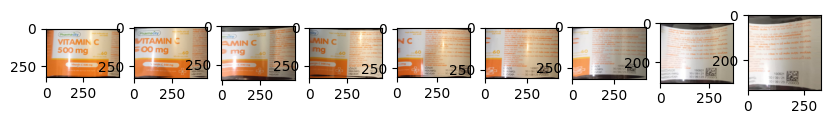

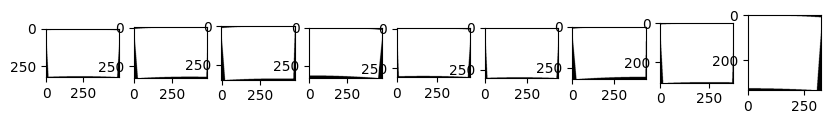

In [56]:
#COMPOSTING
#-----wrap------
from stitching.warper import Warper

warper = Warper()
warper.set_scale(cameras)

#----wrap low resolution-------------
low_sizes = img_handler.get_low_img_sizes()
camera_aspect = img_handler.get_medium_to_low_ratio()      # since cameras were obtained on medium imgs

warped_low_imgs = list(warper.warp_images(low_imgs, cameras, camera_aspect))
warped_low_masks = list(warper.create_and_warp_masks(low_sizes, cameras, camera_aspect))
low_corners, low_sizes = warper.warp_rois(low_sizes, cameras, camera_aspect)
#----wrap final resolution-------------
final_sizes = img_handler.get_final_img_sizes()
camera_aspect = img_handler.get_medium_to_final_ratio()    # since cameras were obtained on medium imgs

warped_final_imgs = list(warper.warp_images(final_imgs, cameras, camera_aspect))
warped_final_masks = list(warper.create_and_warp_masks(final_sizes, cameras, camera_aspect))
final_corners, final_sizes = warper.warp_rois(final_sizes, cameras, camera_aspect)
plot_images(warped_low_imgs, (10,10))
plot_images(warped_low_masks, (10,10))

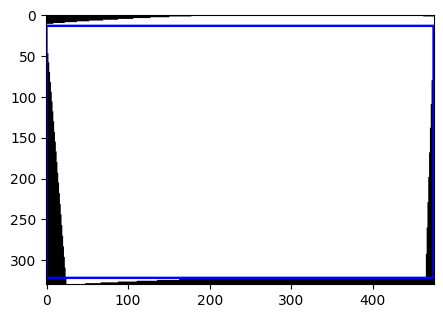

In [57]:
#------crop----------------
from stitching.cropper import Cropper

cropper = Cropper()
mask = cropper.estimate_panorama_mask(warped_low_imgs, warped_low_masks, low_corners, low_sizes)
lir = cropper.estimate_largest_interior_rectangle(mask)
plot = lir.draw_on(mask, size=2)
low_corners = cropper.get_zero_center_corners(low_corners)
rectangles = cropper.get_rectangles(low_corners, low_sizes)

plot = rectangles[1].draw_on(plot, (0, 255, 0), 2)  # The rectangle of the center img
overlap = cropper.get_overlap(rectangles[1], lir)
plot = overlap.draw_on(plot, (255, 0, 0), 2)
intersection = cropper.get_intersection(rectangles[1], overlap)
plot = intersection.draw_on(warped_low_masks[1], (255, 0, 0), 2)
cropper.prepare(warped_low_imgs, warped_low_masks, low_corners, low_sizes)

cropped_low_masks = list(cropper.crop_images(warped_low_masks))
cropped_low_imgs = list(cropper.crop_images(warped_low_imgs))
low_corners, low_sizes = cropper.crop_rois(low_corners, low_sizes)

lir_aspect = img_handler.get_low_to_final_ratio()  # since lir was obtained on low imgs
cropped_final_masks = list(cropper.crop_images(warped_final_masks, lir_aspect))
cropped_final_imgs = list(cropper.crop_images(warped_final_imgs, lir_aspect))
final_corners, final_sizes = cropper.crop_rois(final_corners, final_sizes, lir_aspect)

plot_image(plot, (5,5))

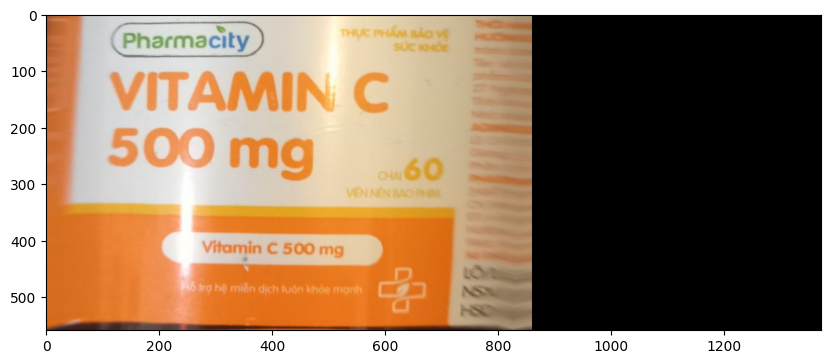

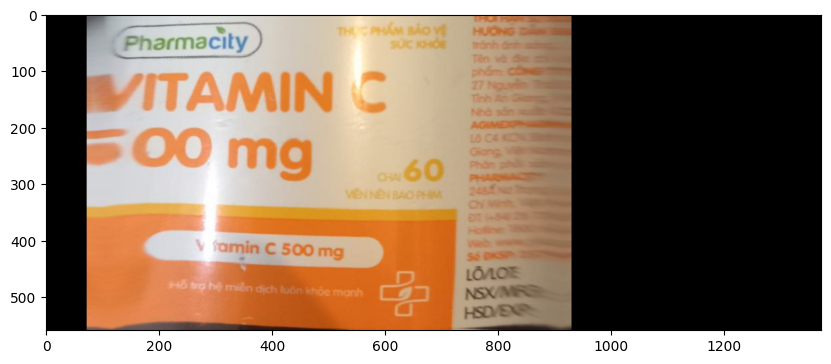

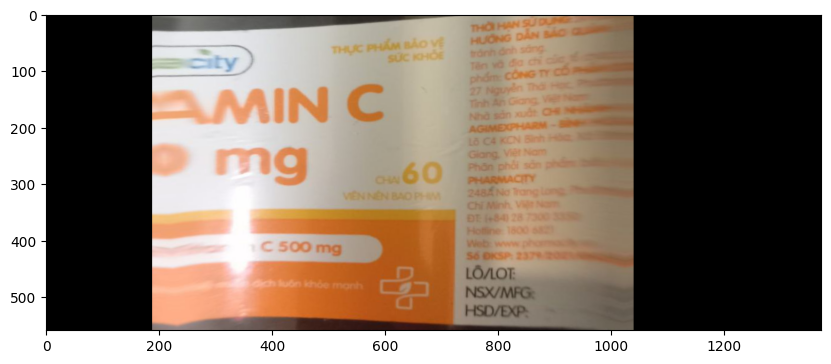

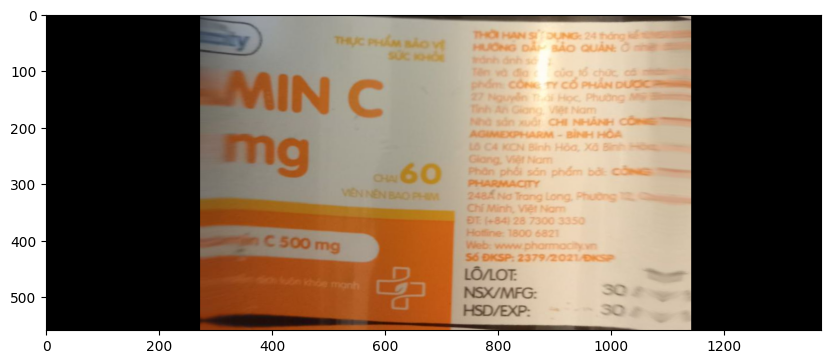

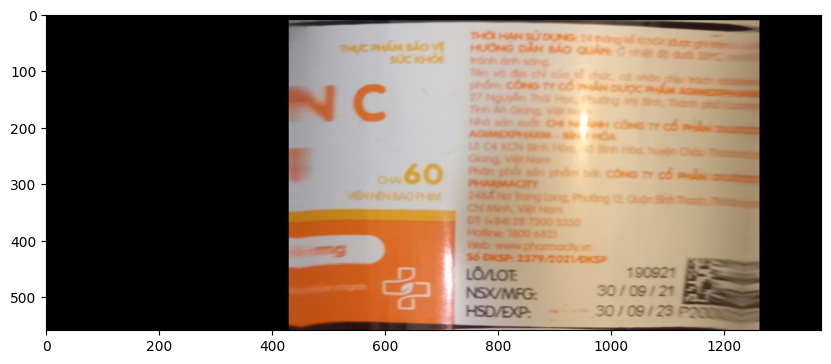

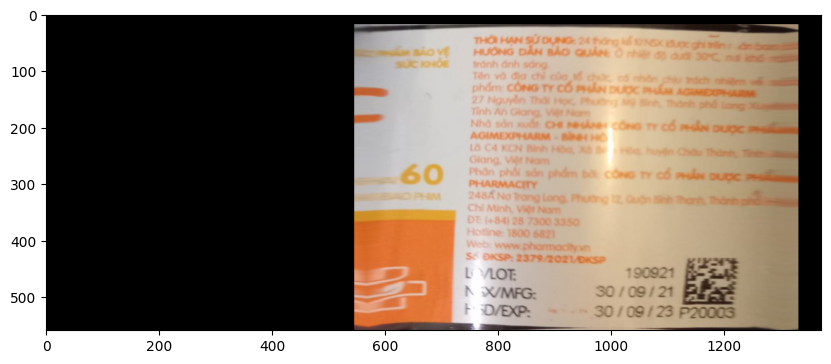

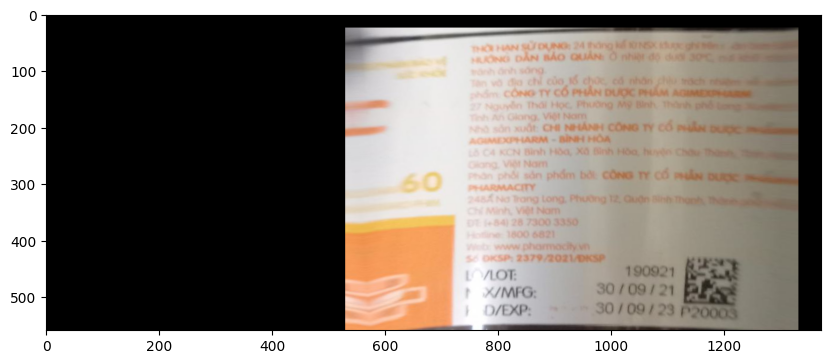

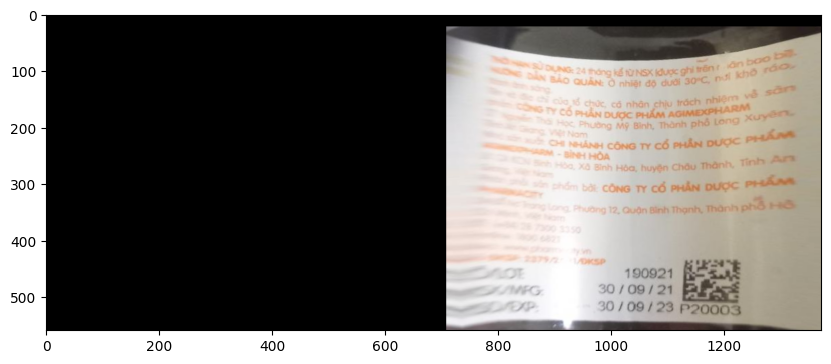

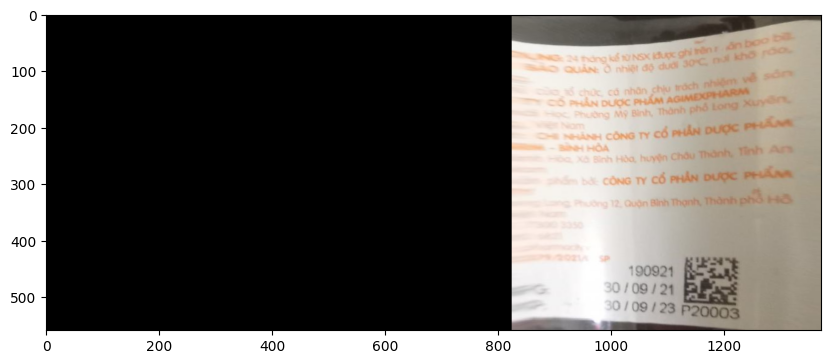

In [58]:
from stitching.timelapser import Timelapser
timelapser = Timelapser('as_is')
timelapser.initialize(final_corners, final_sizes)

for img, corner in zip(cropped_final_imgs, final_corners):
    timelapser.process_frame(img, corner)
    frame = timelapser.get_frame()
    plot_image(frame, (10,10))

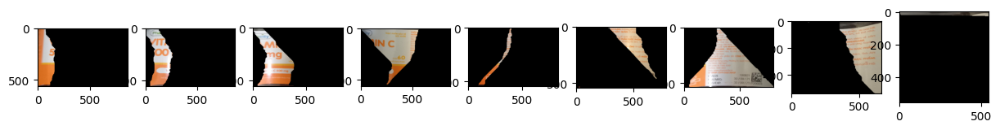

In [59]:
#-------seam mask------------------
from stitching.seam_finder import SeamFinder

seam_finder = SeamFinder()

seam_masks = seam_finder.find(cropped_low_imgs, low_corners, cropped_low_masks)
seam_masks = [seam_finder.resize(seam_mask, mask) for seam_mask, mask in zip(seam_masks, cropped_final_masks)]

seam_masks_plots = [SeamFinder.draw_seam_mask(img, seam_mask) for img, seam_mask in zip(cropped_final_imgs, seam_masks)]
plot_images(seam_masks_plots, (15,10))

In [60]:
#-----Exposure Error Compensation----------
from stitching.exposure_error_compensator import ExposureErrorCompensator

compensator = ExposureErrorCompensator()

compensator.feed(low_corners, cropped_low_imgs, cropped_low_masks)

compensated_imgs = [compensator.apply(idx, corner, img, mask) 
                    for idx, (img, mask, corner) 
                    in enumerate(zip(cropped_final_imgs, cropped_final_masks, final_corners))]
#------blending----------------
from stitching.blender import Blender

blender = Blender()
blender.prepare(final_corners, final_sizes)
for img, mask, corner in zip(compensated_imgs, seam_masks, final_corners):
    blender.feed(img, mask, corner)
panorama, _ = blender.blend()

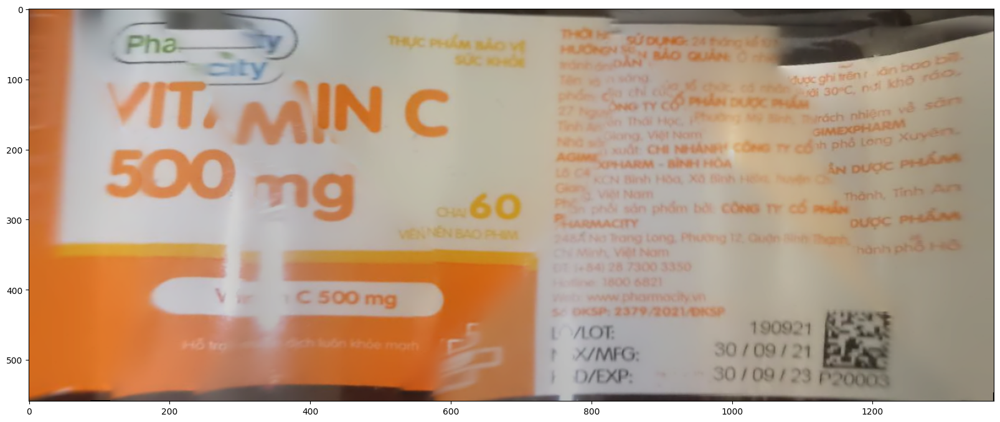

In [61]:
plot_image(panorama, (20,20))

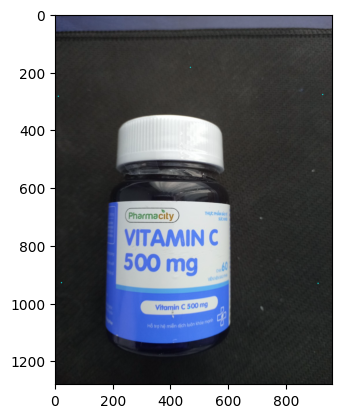

In [5]:
from unwrap_labels import *
import cv2
import matplotlib.pyplot as plt

shape = {"tag": "label", "shape": [{"x": 0.012232142857142842, "y": 0.2219140625},
                                    {"x": 0.48655701811449864, "y": 0.14404355243445227},
                                    {"x": 0.9632539682539681, "y": 0.2171875},
                                    {"x": 0.9466567460317459, "y": 0.7276953125},
                                    {"x": 0.48447501824501454, "y": 0.7952298867391453},
                                    {"x": 0.023134920634920626, "y": 0.7258984375}]}

points = []
for point in shape['shape']:
    points.append([point['x'], point['y']])
imcv = cv2.imread('imgCy_1.jpg', cv2.IMREAD_UNCHANGED)

unwrapper = LabelUnwrapper(src_image=imcv, percent_points=points)

dst_image = unwrapper.unwrap()
for point in unwrapper.points:
    cv2.line(unwrapper.src_image, tuple(point), tuple(point), color=YELLOW_COLOR, thickness=3)
plt.imshow(imcv)

In [6]:
imcv.shape

(1280, 960, 3)

In [19]:
import cv2
import numpy as np
from PIL import Image
import skimage 
from scipy import signal
import matplotlib.pyplot as plt
from operator import itemgetter

In [20]:
def getPolarPoint(img,m,n): # the idea is checking row by row to calculate how many white pixel in the image/ if no white pixel=> sum=0
  sumx = 0
  polar1 =0
  polar2 =m-1
  while sumx ==0: 
    sumx = np.sum(img[polar1])
    polar1+=1
  sumx = 0
  while sumx ==0: 
    sumx = np.sum(img[polar2])
    polar2-=1
  return polar1, polar2
def getFilterPolarPoint(img,m,n): # similar to getPolarPoint but applied for filter
  sumx = 0
  polar1 =-1
  polar2 =m-1
  while (sumx <1) and (polar1<=m-1): 
    sumx = img[polar1]
    polar1+=1

  sumx = 0
  while (sumx <1) and (polar2>=0): 
    sumx = img[polar2]
    polar2-=1
  return polar1, polar2


In [21]:
def Processing1Img(imgInput):
    img = imgInput.copy()
    imgHSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h_min = 0
    h_max = 179
    s_min = 0
    s_max = 255
    v_min = 90
    v_max = 255
    lower= np.array([h_min,s_min,v_min])
    upper= np.array([h_max,s_max,v_max])
    mask = cv2.inRange(imgHSV,lower,upper)
    kernel = np.ones((5, 5), np.uint8)
    #diagnoise
    dialation = cv2.dilate(mask, kernel, iterations = 1)  
    erodesion = cv2.erode(dialation,kernel, iterations= 6)
    diagnoised = cv2.dilate(erodesion, kernel, iterations = 5)    
    blur = cv2.GaussianBlur(diagnoised,(5,5),0)
    edged = cv2.Canny(blur, 0, 100)
    return edged,diagnoised

In [22]:
def FilterContour(cnt,filterOut):
    filter = filterOut.copy()
    output = np.zeros_like(filterOut)
    frameCnt = []
    maxArea = 0
    cv2.drawContours(filter,cnt,-1,color=(255,255,255),thickness=3)
    kernel = np.ones((3, 3), np.uint8)
    dialation = cv2.dilate(filter, kernel, iterations = 4)
    blur = cv2.GaussianBlur(dialation ,(5,5),0)
    edged = cv2.Canny(blur, 0, 100)
    contours, hierarchy = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    for cnt in contours:
        cv2.fillPoly(output,pts=[cnt],color=(255,255,255))
        if (cv2.contourArea(cnt) >20000) and (cv2.contourArea(cnt)>maxArea):  
            maxArea = cv2.contourArea(cnt)
            frameCnt.append( cnt )
    if len(frameCnt) > 0:
        outside = frameCnt[-1]
        return output,outside
    else:
        return output,0

In [23]:
def UpgradeFilterContour(cnt,filterOut):
    filter = filterOut.copy()
    output = np.zeros_like(filterOut)
    frameCnt = []
    maxArea = 0
    cv2.drawContours(filter,cnt,-1,color=(255,255,255),thickness=3)
    kernel = np.ones((3, 3), np.uint8)
    dialation = cv2.dilate(filter, kernel, iterations = 4)
    blur = cv2.GaussianBlur(dialation ,(5,5),0)
    edged = cv2.Canny(blur, 0, 100)
    contours, hierarchy = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    for cnt in contours:
        cv2.fillPoly(output,pts=[cnt],color=(255,255,255))
        if (cv2.contourArea(cnt) >20000) and (cv2.contourArea(cnt)>maxArea):  
            maxArea = cv2.contourArea(cnt)
            frameCnt.append( cnt )
    #upgrade part
    
        

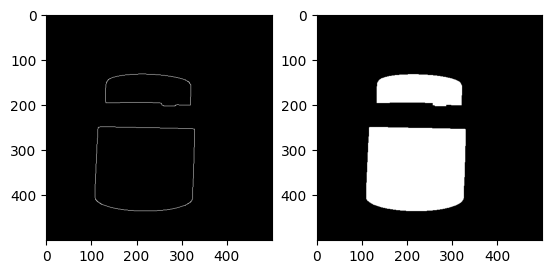

In [38]:
img = cv2.imread('imgCy_1.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img = cv2.resize(img,[500,500],cv2.INTER_CUBIC) # scaling
edged,diagnoised = Processing1Img(img)
plt.subplot(1,2,1)
plt.imshow(edged,cmap='gray')
plt.subplot(1,2,2)
plt.imshow(diagnoised,cmap='gray')
plt.show()

In [39]:
plt.subplot

<function matplotlib.pyplot.subplot(*args, **kwargs)>

In [40]:
# contours, hierarchy = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
# img = np.zeros_like(edged)
# for cnt in contours:
#     cv2.fillPoly(img,pts=[cnt],color = [255,255,255])
# plt.imshow(img)

2
773.3380935192108
centerPoint: 277.43565683646113
outsideCnt: [[[119 249]]

 [[118 250]]

 [[117 250]]

 ...

 [[122 249]]

 [[121 249]]

 [[120 249]]]
(500, 500, 3)


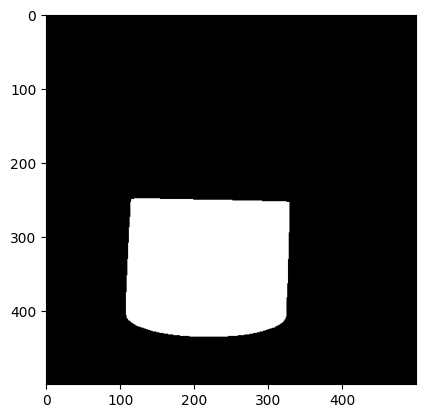

In [41]:
contours, hierarchy = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
print(len(contours))
img2 = np.zeros_like(img)
filterOut = np.zeros_like(img) # for flatten cylinder
frameCnt =[]
frameLength = []
maxArea = 0
max = 0
for cnt in contours:
    centerPoint = np.mean(cnt)
    if (cv2.arcLength(cnt, True) >500) and (centerPoint > 200) and (cv2.contourArea(cnt) >20000) and (cv2.contourArea(cnt)>maxArea):
            filterOut = np.zeros_like(img)
            frameCnt.append( cnt )
            maxArea = cv2.contourArea(cnt)
            print(cv2.arcLength(cnt, True) )
            print('centerPoint:',centerPoint)
            cv2.fillPoly(filterOut,pts=[cnt],color=(255,255,255))
            
Filtercontours = frameCnt[-1]
print('outsideCnt:',Filtercontours)
plt.imshow(filterOut)
print(img.shape)

In [57]:
def FlattenImage(outside, img):
    # finding 2 polar point (y coordinate)
    # (because the bottle have cyclindrical shape 
    # so the line will be bending and have the highest/ lowest point
    img2 = np.zeros_like(img) 
    xp,yp1,w,h = cv2.boundingRect(outside)
    yp2 = yp1+h
    #finding 4 point of rectangle
    perimeter = cv2.arcLength(outside, True)
    approx = cv2.approxPolyDP(outside, 0.05 * perimeter, True)
    for point in approx:
        x, y = point[0]
        cv2.circle(img2, (x, y), 3, (255, 255, 255), -1)
    p1,p2,p3,p4 = approx.reshape(4,2)
    listpoints =[p1,p2,p3,p4]
    listpoints = sorted(listpoints, key=itemgetter(0))
    p1,p2 = sorted([listpoints[0],listpoints[1]], key=itemgetter(1))
    p3,p4 = sorted([listpoints[2],listpoints[3]], key=itemgetter(1))
    pup = [(int)((p1[0]+p3[0])/2) , yp1]
    pdown = [(int)((p2[0]+p4[0])/2) , yp2]
    cv2.circle(img2, (pup[0], yp1), 3, (0, 255, 0), -1)
    cv2.circle(img2, (pdown[0], yp2), 3, (0, 0, 255), -1)
    """
            In both cases points represent figure below:

        |        |                  |        |
        |    up   |                  A    B    C
        | /    \ |                  | /    \ |
        1        3                  |        |
        |        |                  |        |
        |        |       OR         |        |
        |        |                  |        |
        2        4                  F        D
        | \    / |                  | \    / |
        |   do   |                  |   E    |
        |        |                  |        |
    """
    #A,B,C,D,E,F,G
    return img2,p1,pup,p3,p4,pdown,p2

In [51]:
def FlattenImage(outside, img):
    # finding 2 polar point (y coordinate)
    # (because the bottle have cyclindrical shape 
    # so the line will be bending and have the highest/ lowest point
    img2 = np.zeros_like(img) 
    xp,yp1,w,h = cv2.boundingRect(outside)
    yp2 = yp1+h
    #finding 4 point of rectangle
    perimeter = cv2.arcLength(outside, True)
    approx = cv2.approxPolyDP(outside, 0.05 * perimeter, True)
    for point in approx:
        x, y = point[0]
        cv2.circle(img2, (x, y), 3, (0, 255, 0), -1)
    p1,p2,p3,p4 = approx.reshape(4,2) 
    pup = [(int)((p1[0]+p4[0])/2) , yp1]
    pdown = [(int)((p3[0]+p2[0])/2) , yp2]
    cv2.circle(img2, (pup[0], yp1), 3, (255, 0, 0), -1)
    cv2.circle(img2, (pdown[0], yp2), 3, (0, 0, 255), -1)
    """
            In both cases points represent figure below:

        |        |                  |        |
        |   up   |                  A   B   C
        | /    \ |                  | /    \ |
        1        4                  |        |
        |        |                  |        |
        |        |       OR         |        |
        |        |                  |        |
        2        3                  F        D
        | \    / |                  | \    / |
        |   do   |                  |   E    |
        |        |                  |        |
    """
    #A,B,C,D,E,F,G
    return img2,p1,pup,p4,p3,pdown,p2

(500, 500, 3)


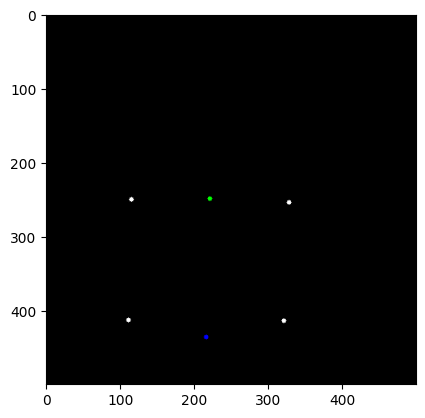

In [58]:
img2,pA,pB,pC,pD,pE,pF = FlattenImage(outside=Filtercontours,img = filterOut)
plt.imshow(img2)
print(img2.shape)

In [59]:
print(pA)
print(pB)
print(pC)
print(pD)
print(pE)
print(pF)

[115 250]
[221, 249]
[328 254]
[321 414]
[216, 436]
[111 413]


In [53]:
print(pA)
print(pB)
print(pC)
print(pD)
print(pE)
print(pF)

[115 250]
[221, 249]
[328 254]
[321 414]
[216, 436]
[111 413]


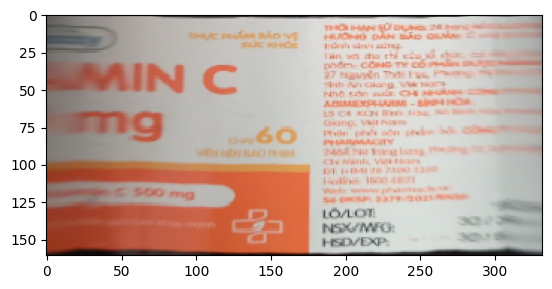

In [60]:
import unwrap_labels
unwrapper = unwrap_labels.LabelUnwrapper(src_image=img, pixel_points=[pA,pB,pC,pD,pE,pF])
dst_image = unwrapper.unwrap()
plt.imshow(dst_image)

In [114]:
D1 = dst_image

In [119]:
D2 = dst_image

In [124]:
D3 = dst_image

In [1]:
import stitching
import os
def plot_image(img, figsize_in_inches=(5,5)):
    fig, ax = plt.subplots(figsize=figsize_in_inches)
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()
def plot_images(imgs, figsize_in_inches=(10,10)):
    fig, axs = plt.subplots(1, len(imgs), figsize=figsize_in_inches)
    for col, img in enumerate(imgs):
        axs[col].imshow(img)
    plt.show()
plot_images([D1,D2,D3])
plt.imsave('image_unwrapped/D1.jpg',D1)
plt.imsave('image_unwrapped/D2.jpg',D2)
plt.imsave('image_unwrapped/D3.jpg',D3)

NameError: name 'D1' is not defined

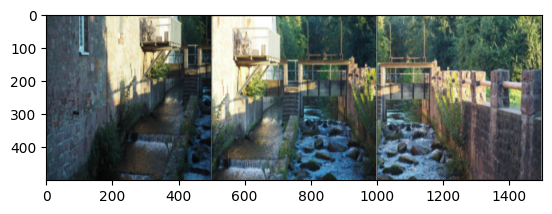

In [16]:
stitcher = stitching.Stitcher()
list_image_name =['image_unwrapped\D1.jpg', 'image_unwrapped\D2.jpg', 'image_unwrapped\D3.jpg']
img1 = plt.imread("testStitching_1.JPG")
img1 = cv2.resize(img1,[500,500],cv2.INTER_CUBIC)
img2 = plt.imread("testStitching_2.JPG")
img2 = cv2.resize(img2,[500,500],cv2.INTER_CUBIC)
img3 = plt.imread("testStitching_3.JPG")
img3 = cv2.resize(img3,[500,500],cv2.INTER_CUBIC)
imgs = [img1, img2, img3]

# panorama = stitcher.stitch([img1, img2, img3])
concatenateImg= np.concatenate(imgs, axis=1)
plt.imshow(concatenateImg)

1459.3969686031342
centerPoint: 262.0641470180305
1393.3969686031342
centerPoint: 254.68713662790697
1459.3969686031342
centerPoint: 262.0641470180305
1332.911687374115
centerPoint: 259.45864946889225


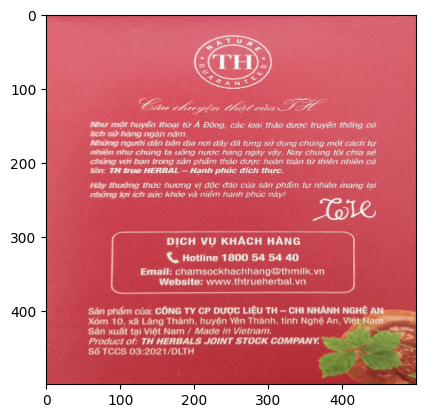

In [1]:
from ImageExtract import ImageExtracter,ConnectData,OCR_extracter
import numpy as np
import cv2
import stitching
import unwrap_labels
import os 
from PIL import Image
import skimage 
from scipy import signal
import matplotlib.pyplot as plt
listname = ['imgRec_1.jpg','imgRec_2.jpg','imgRec_3.jpg','imgRec_4.jpg']
imgs = []
for name in listname:
    img = cv2.imread(name)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    extracter = ImageExtracter(img)
    _ = extracter.FindLabelRegion()
    extracter.ProcessingImage()
    imgs.append(extracter.ProcessedOutput)
plt.imshow(imgs[1])

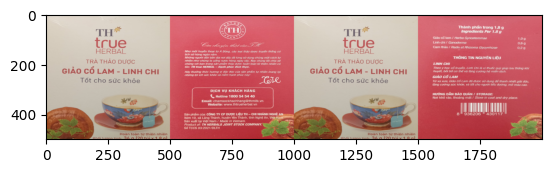

In [2]:
output = ConnectData(imgs)
plt.imshow(output)

Loads checkpoint by http backend from path: https://download.openmmlab.com/mmocr/textdet/dbnet/dbnet_resnet50-oclip_1200e_icdar2015/dbnet_resnet50-oclip_1200e_icdar2015_20221102_115917-bde8c87a.pth
06/04 23:22:23 - mmengine - WARNING - Failed to search registry with scope "mmocr" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmocr" is a correct scope, or whether the registry is initialized.
06/04 23:22:23 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmocr/textrecog/sar/sar_resnet31_parallel-decoder_5e_st-sub_mj-sub_sa_real/sar_resnet31_parallel-decoder_5e_st-sub_mj-sub_sa_real_20220915_171910-04eb4e75.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preproc

Output()

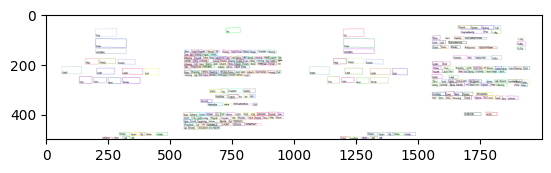

In [3]:

imgOCR = np.zeros_like(output)
imgOCR[:,:,0] = cv2.cvtColor(output,cv2.COLOR_BGR2GRAY)
imgOCR[:,:,1] = cv2.cvtColor(output,cv2.COLOR_BGR2GRAY)
imgOCR[:,:,2] = cv2.cvtColor(output,cv2.COLOR_BGR2GRAY)
Text_extracter = OCR_extracter(output)
mask = Text_extracter.TextRecognition() 
plt.imshow(mask)

In [12]:
Text_extracter.dict_words

[{'coordinate:': [[417, 494], [417, 482], [429, 482], [429, 494]],
  'word:': 'x'},
 {'coordinate:': [[271, 493], [271, 481], [306, 481], [306, 493]],
  'word:': 'tinh:'},
 {'coordinate:': [[1271, 481], [1305, 480], [1306, 493], [1272, 494]],
  'word:': 'tinh:'},
 {'coordinate:': [[1431, 494], [1431, 479], [1480, 479], [1480, 495]],
  'word:': '1,8g)'},
 {'coordinate:': [[1225, 493], [1225, 479], [1269, 480], [1268, 494]],
  'word:': 'iluang'},
 {'coordinate:': [[431, 495], [431, 478], [480, 478], [480, 496]],
  'word:': '1,8g)'},
 {'coordinate:': [[225, 493], [225, 479], [269, 480], [268, 494]],
  'word:': 'ilugng'},
 {'coordinate:': [[1387, 494], [1388, 477], [1416, 478], [1416, 495]],
  'word:': 'tui'},
 {'coordinate:': [[189, 492], [189, 479], [223, 479], [223, 492]],
  'word:': 'Khoi'},
 {'coordinate:': [[1355, 478], [1386, 477], [1387, 494], [1356, 495]],
  'word:': '(201'},
 {'coordinate:': [[1188, 492], [1188, 478], [1224, 478], [1224, 492]],
  'word:': 'Khoi'},
 {'coordinate:'

In [6]:
Text_extracter.ExtractToCSVfile()

In [4]:
output = Text_extracter.TextDetection()
plt.show(output)

Loads checkpoint by http backend from path: https://download.openmmlab.com/mmocr/textdet/textsnake/textsnake_resnet50-oclip_fpn-unet_1200e_ctw1500/textsnake_resnet50-oclip_fpn-unet_1200e_ctw1500_20221101_134814-a216e5b2.pth


Output()

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

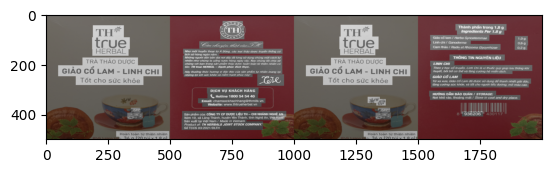

In [5]:
plt.imshow(output)

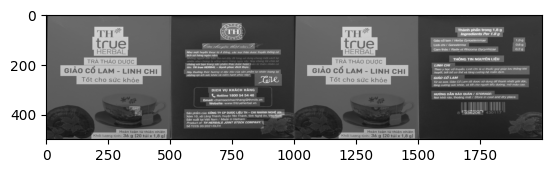

In [15]:
plt.imshow(Text_extracter.colorImg)

In [72]:
img1,mask1,output1 = Text_extracter.TextDetection(imgOCR)

Loads checkpoint by http backend from path: https://download.openmmlab.com/mmocr/textdet/textsnake/textsnake_resnet50-oclip_fpn-unet_1200e_ctw1500/textsnake_resnet50-oclip_fpn-unet_1200e_ctw1500_20221101_134814-a216e5b2.pth


Output()

In [73]:
import torch, torchvision
import mmdet
import mmcv
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
from mmocr.apis import MMOCRInferencer,TextDetInferencer

In [97]:
def TextDetection(img,colorImage):
    model = TextDetInferencer(model='TextSnake', device='cuda')
    AIoutput = model(img, show=True)
    _polylines = AIoutput['predictions'][0]['polygons'] # => the output will the the contours of image
    shapes = np.zeros_like(img)
    output = img.copy()
    for cnt in _polylines:
        n = len(cnt)
        cnt = np.array(cnt,dtype=int).reshape(int(n/2),2)
        x,y,w,h = cv2.boundingRect(cnt)
        shapes = cv2.rectangle(shapes,(x,y),(x+w,y+h),(255,255,255),-1)
    alpha = 0.5
    mask = shapes<125
    output[mask] = cv2.addWeighted(colorImage, alpha, shapes, 1 - alpha, 0)[mask]
    return img,shapes,output


In [98]:
img1,mask1,output1 = TextDetection(imgOCR,output)

Loads checkpoint by http backend from path: https://download.openmmlab.com/mmocr/textdet/textsnake/textsnake_resnet50-oclip_fpn-unet_1200e_ctw1500/textsnake_resnet50-oclip_fpn-unet_1200e_ctw1500_20221101_134814-a216e5b2.pth


Output()

In [99]:
output1.shape

(500, 2000, 3)

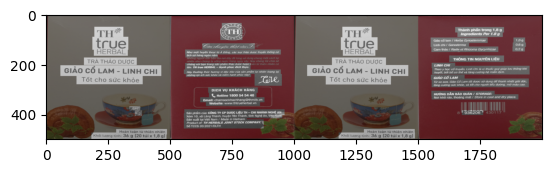

In [100]:
plt.imshow(output1)

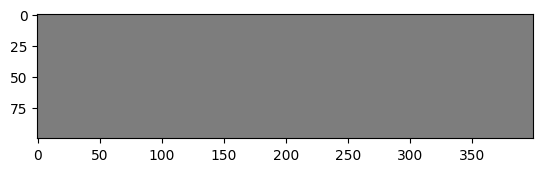

: 

In [7]:
plt.imshow(np.ones((100,400,3),dtype=np.uint8)*125)

In [2]:
import ImageExtract
rawImage = ImageExtract.ConnectData(imgs)
Text_extracter = ImageExtract.OCR_extracter(rawImage)
mask = Text_extracter.TextRecognition()
Text_extracter.ExtractToCSVfile()
extractedImage = Text_extracter.TextDetection()
 

Loads checkpoint by http backend from path: https://download.openmmlab.com/mmocr/textdet/dbnet/dbnet_resnet50-oclip_1200e_icdar2015/dbnet_resnet50-oclip_1200e_icdar2015_20221102_115917-bde8c87a.pth
06/02 20:15:17 - mmengine - WARNING - Failed to search registry with scope "mmocr" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmocr" is a correct scope, or whether the registry is initialized.
06/02 20:15:17 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmocr/textrecog/sar/sar_resnet31_parallel-decoder_5e_st-sub_mj-sub_sa_real/sar_resnet31_parallel-decoder_5e_st-sub_mj-sub_sa_real_20220915_171910-04eb4e75.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preproc

Output()

Loads checkpoint by http backend from path: https://download.openmmlab.com/mmocr/textdet/textsnake/textsnake_resnet50-oclip_fpn-unet_1200e_ctw1500/textsnake_resnet50-oclip_fpn-unet_1200e_ctw1500_20221101_134814-a216e5b2.pth


Output()

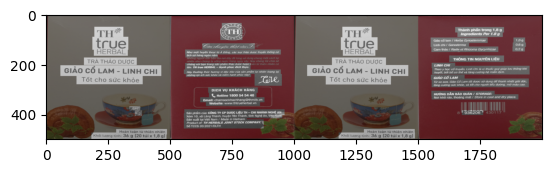

In [3]:
plt.imshow(extractedImage)

In [1]:
import ImageExtract
import cv2
import matplotlib.pyplot as plt
listname = ['imgCy_1.jpg','imgCy_2.jpg','imgCy_3.jpg','imgCy_4.jpg','imgCy_5.jpg','imgCy_6.jpg','imgCy_7.jpg','imgCy_8.jpg','imgCy_9.jpg']
imgs = []
for name in listname:
    img = cv2.imread(name)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    extracter = ImageExtract.ImageExtracter(img,cylinder=True)
    _ = extracter.FindLabelRegion()
    extracter.ProcessingImage()
    imgs.append(extracter.ProcessedOutput)
# rawImage = ImageExtract.ConnectData(imgs)
# plt.imshow(rawImage)

779.0954529047012
centerPoint: 274.7662682602922
872.1665205955505
centerPoint: 281.50236966824644
941.3208485841751
centerPoint: 243.46934225195093
989.8061298131943
centerPoint: 280.61664899257687
1024.4924215078354
centerPoint: 255.52395514780835
1024.2497808933258
centerPoint: 236.77698574338086
886.3502861261368
centerPoint: 230.04250295159386
724.7939372062683
centerPoint: 247.43260869565216
771.8650048971176
centerPoint: 253.95578231292518


In [8]:
imgs = []

771.8650048971176
centerPoint: 253.95578231292518


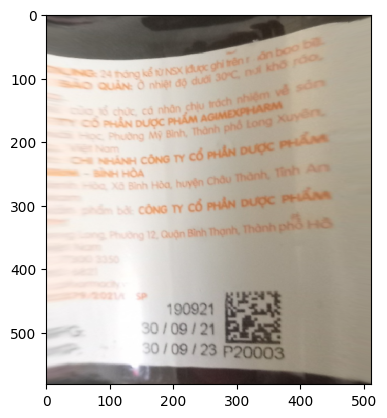

In [47]:
import ImageExtract
import cv2
import matplotlib.pyplot as plt
name = 'imgCy_9.jpg'
img = cv2.imread(name)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
extracter = ImageExtract.ImageExtracter(img,cylinder=True)
_ = extracter.FindLabelRegion()
extracter.ProcessingImage()
imgs.append(extracter.ProcessedOutput)
plt.imshow(extracter.ProcessedOutput)


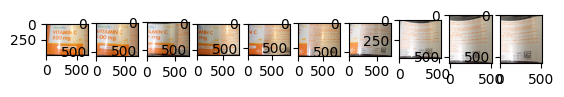

In [48]:
n = len(imgs)
for i in range(n):
    plt.subplot(1,n,(i+1))
    plt.imshow(imgs[i])
plt.show()

Loads checkpoint by http backend from path: https://download.openmmlab.com/mmocr/textdet/dbnet/dbnet_resnet50-oclip_1200e_icdar2015/dbnet_resnet50-oclip_1200e_icdar2015_20221102_115917-bde8c87a.pth
06/04 20:06:35 - mmengine - WARNING - Failed to search registry with scope "mmocr" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmocr" is a correct scope, or whether the registry is initialized.
06/04 20:06:35 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmocr/textrecog/sar/sar_resnet31_parallel-decoder_5e_st-sub_mj-sub_sa_real/sar_resnet31_parallel-decoder_5e_st-sub_mj-sub_sa_real_20220915_171910-04eb4e75.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preproc

Output()

Loads checkpoint by http backend from path: https://download.openmmlab.com/mmocr/textdet/textsnake/textsnake_resnet50-oclip_fpn-unet_1200e_ctw1500/textsnake_resnet50-oclip_fpn-unet_1200e_ctw1500_20221101_134814-a216e5b2.pth


Output()

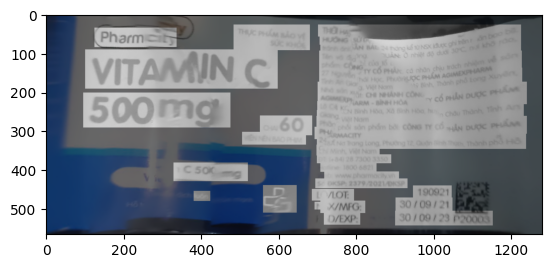

In [2]:
rawImage = ImageExtract.ConnectData(imgs,cylinder = True)
Text_extracter = ImageExtract.OCR_extracter(rawImage)
mask = Text_extracter.TextRecognition()
Text_extracter.ExtractToCSVfile()
extractedImage = Text_extracter.TextDetection()
plt.imshow(extractedImage)
plt.show()